In [1]:
!date

Mon Sep 23 15:33:27 EDT 2024


In [2]:
pwd

'/mmfs1/data/aglinska/BC-ABCD-denoise/Code'

In [3]:
import ants
import numpy as np
import os
from matplotlib import pyplot as plt
from tqdm import tqdm

/data/aglinska/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
/data/aglinska/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
/data/aglinska/anaconda3/lib/python3.8/site-packages/paramiko/transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [4]:
from sklearn.decomposition import PCA
from sklearn import linear_model

In [5]:
#indir = '../Data/020-fmriprepped/sub-NDARINV1H7JEJW1/ses-baselineYear1Arm1/func/sub-NDARINV1H7JEJW1_ses-baselineYear1Arm1_task-nback_run-02_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii'
indir = '../Data/020-fmriprepped/'
subs_orig = [s for s in os.listdir(indir) if all((s.startswith('sub'),not s.endswith('.html')))]
n_orig = len(subs_orig)
epi_fn = os.path.join(indir,'{sub}/ses-baselineYear1Arm1/func/{sub}_ses-baselineYear1Arm1_task-nback_run-0{r}_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii')
cf_fn = os.path.join(indir,'{sub}/ses-baselineYear1Arm1/anat/analysis_mask_CF.nii')
gm_fn = os.path.join(indir,'{sub}/ses-baselineYear1Arm1/anat/analysis_mask_GM.nii')

subs = [sub for sub in subs_orig if all(( 
    os.path.exists(epi_fn.format(sub=sub,r=1)),
    os.path.exists(epi_fn.format(sub=sub,r=2)),
    os.path.exists(cf_fn.format(sub=sub)),
    os.path.exists(gm_fn.format(sub=sub)),
    ))]

subs.sort()
print(f'{len(subs)}/{len(subs_orig)}')

34/34


 29%|████████████▋                              | 10/34 [10:09<25:06, 62.79s/it]/tmp/ipykernel_2595607/521148600.py:32: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

100%|███████████████████████████████████████████| 34/34 [38:54<00:00, 68.66s/it]


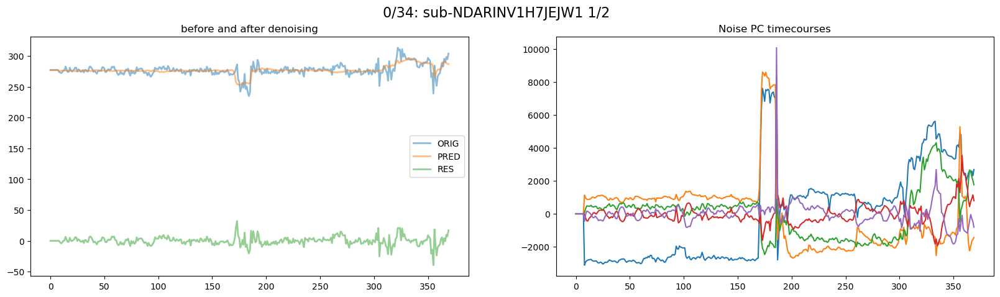

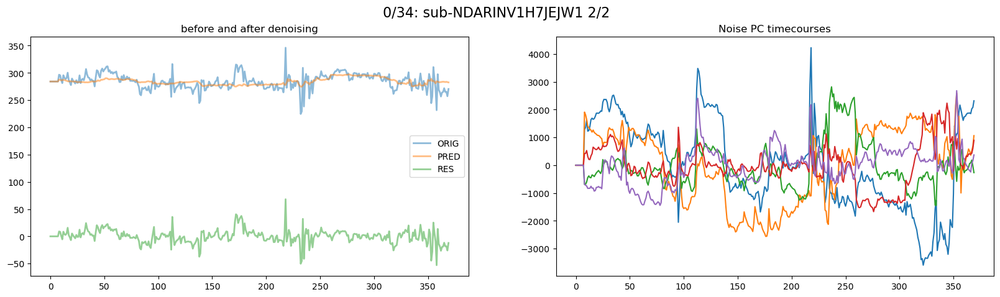

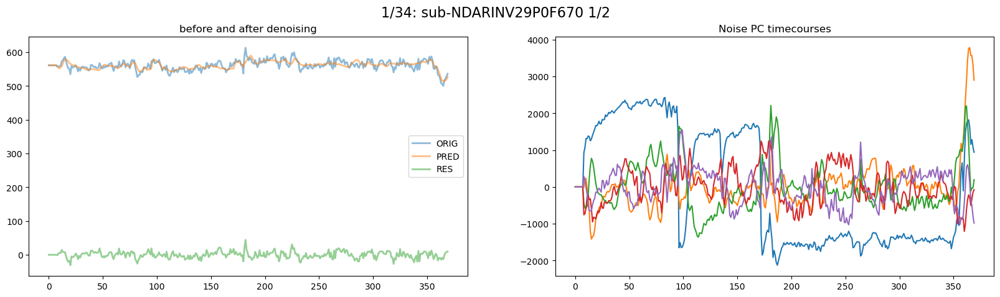

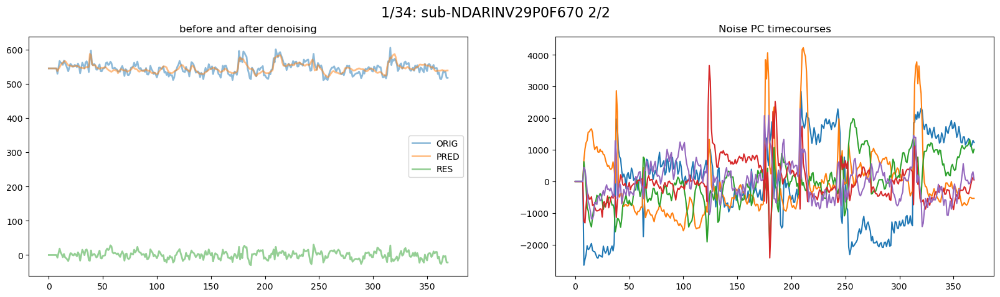

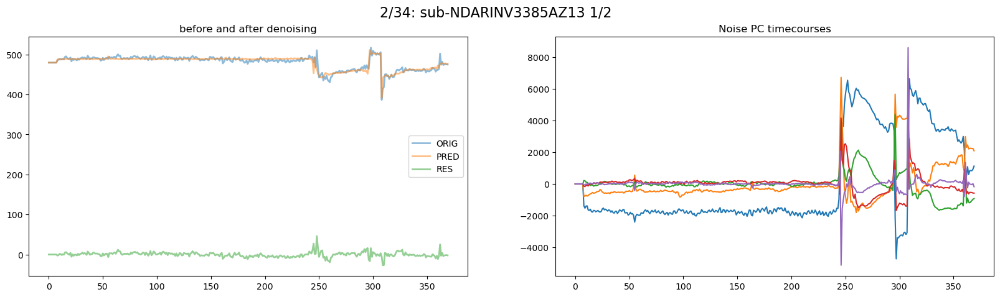

...

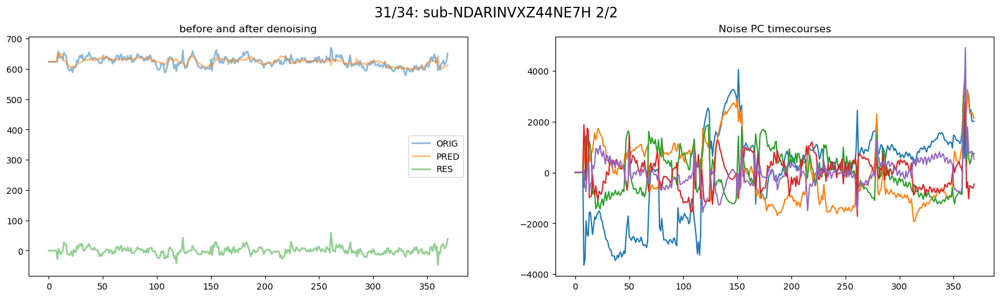

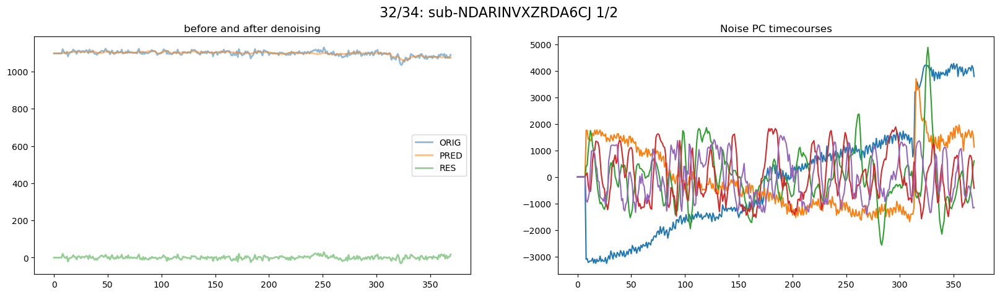

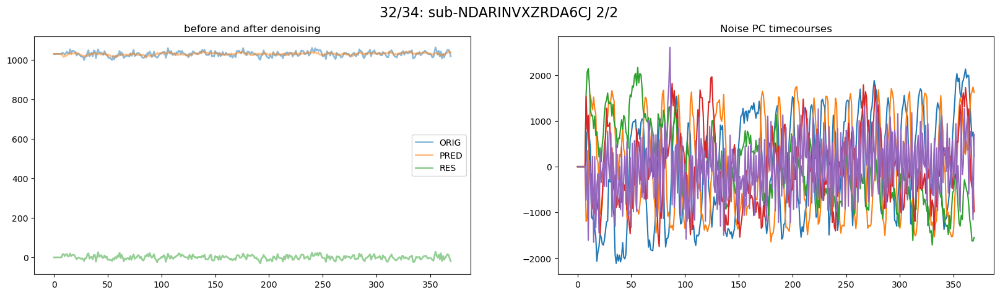

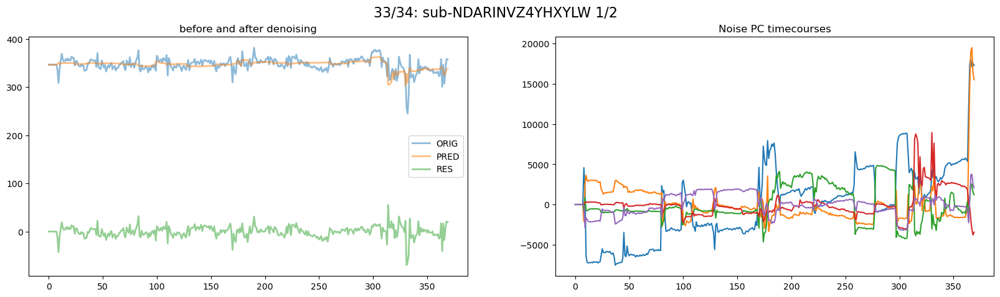

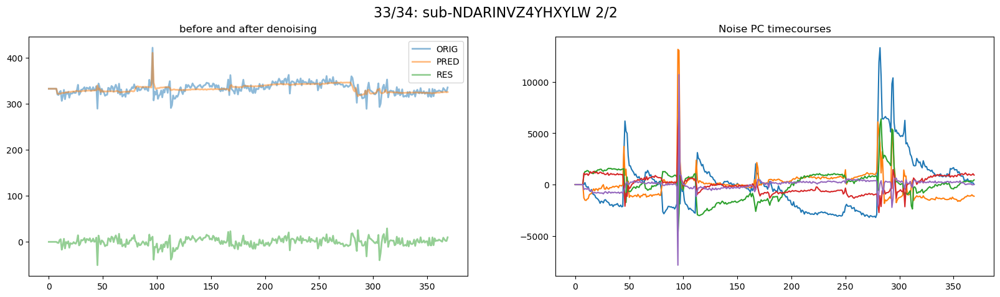

In [10]:
for s in tqdm(range(len(subs))):
    sub = subs[s]
    
    gm = ants.image_read(gm_fn.format(sub=sub))
    cf = ants.image_read(cf_fn.format(sub=sub))
    
    for r in [1,2]:
        epi = ants.image_read(epi_fn.format(sub=sub,r=r))
        
        nt = epi.shape[-1] # Number of timepoints
        
        ndummy = 8 # how many dummies to discard
        
        epi_flat = epi.numpy().reshape(-1,nt).transpose() # (370, 1082035)
        epi_flat[0:ndummy,:] = epi_flat[ndummy+1::,:].mean(axis=0) # What to do with dummy scans, set to mean
        gm_flat = gm.numpy().flatten().astype(int) # (1082035,)
        cf_flat = cf.numpy().flatten().astype(int) # (1082035,)
        #print(epi_flat.shape)
        #print(gm_flat.shape)
        #print(cf_flat.shape)
        
        assert max(np.unique(cf_flat+gm_flat))!=2, 'overlap' # Check for overlap again
        
        cf_pcs = PCA(n_components = 5).fit_transform(epi_flat[:,cf_flat==1]) # (370, 5)
        lin_reg = linear_model.LinearRegression();
        lin_reg.fit(cf_pcs,epi_flat[:,gm_flat==1]);
        predicted = lin_reg.predict(cf_pcs)
        residuals = epi_flat[:,gm_flat==1]-predicted
        
        do_plot = True
        if do_plot==True:
            plt.figure(figsize=(20,5))
            plt.subplot(1,2,1)
            v = 500
            plt.plot(epi_flat[:,gm_flat==1][:,v],alpha=.5,linewidth=2)
            plt.plot(predicted[:,v],alpha=.5,linewidth=2)
            plt.plot(residuals[:,v],alpha=.5,linewidth=2)
            plt.legend(['ORIG','PRED','RES'])
            plt.title('before and after denoising')
            
            plt.subplot(1,2,2)
            plt.plot(cf_pcs)
            plt.title('Noise PC timecourses')
            
            plt.suptitle(
                f'{s}/{len(subs)}: {sub} {r}/2',
            fontsize=16)
        
        
        denoised_flat = np.zeros(epi_flat.shape)
        denoised_flat[:,gm_flat==1]=residuals
        denoised_flat = denoised_flat+epi_flat.mean(axis=0) # Aesthetics
        denoised_mat = denoised_flat.transpose().reshape(epi.shape)
        denoised = epi.new_image_like(denoised_mat)
        ofn = os.path.join(indir,'{sub}/ses-baselineYear1Arm1/func/{sub}_ses-baselineYear1Arm1_task-nback_run-0{r}_space-MNI152NLin2009cAsym_res-2_desc-COMPCORR_bold.nii'.format(sub=sub,r=r))
        denoised.to_filename(ofn)

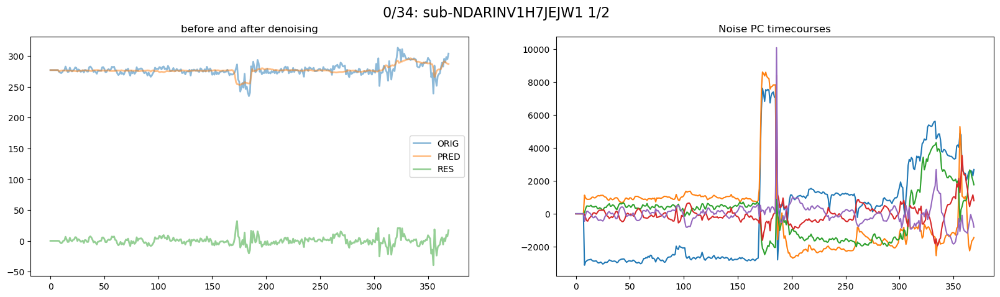

In [6]:
# for s in tqdm(range(len(subs)))
# sub = subs[s]

# gm = ants.image_read(gm_fn.format(sub=sub))
# cf = ants.image_read(cf_fn.format(sub=sub))

# r = 1
# epi = ants.image_read(epi_fn.format(sub=sub,r=r))

# nt = epi.shape[-1] # Number of timepoints

# ndummy = 8 # how many dummies to discard

# epi_flat = epi.numpy().reshape(-1,nt).transpose() # (370, 1082035)
# epi_flat[0:ndummy,:] = epi_flat[ndummy+1::,:].mean(axis=0) # What to do with dummy scans, set to mean
# gm_flat = gm.numpy().flatten().astype(int) # (1082035,)
# cf_flat = cf.numpy().flatten().astype(int) # (1082035,)
# #print(epi_flat.shape)
# #print(gm_flat.shape)
# #print(cf_flat.shape)

# assert max(np.unique(cf_flat+gm_flat))!=2, 'overlap' # Check for overlap again

# cf_pcs = PCA(n_components = 5).fit_transform(epi_flat[:,cf_flat==1]) # (370, 5)
# lin_reg = linear_model.LinearRegression();
# lin_reg.fit(cf_pcs,epi_flat[:,gm_flat==1]);
# predicted = lin_reg.predict(cf_pcs)
# residuals = epi_flat[:,gm_flat==1]-predicted

# do_plot = True
# if do_plot==True:
#     plt.figure(figsize=(20,5))
#     plt.subplot(1,2,1)
#     v = 500
#     plt.plot(epi_flat[:,gm_flat==1][:,v],alpha=.5,linewidth=2)
#     plt.plot(predicted[:,v],alpha=.5,linewidth=2)
#     plt.plot(residuals[:,v],alpha=.5,linewidth=2)
#     plt.legend(['ORIG','PRED','RES'])
#     plt.title('before and after denoising')
    
#     plt.subplot(1,2,2)
#     plt.plot(cf_pcs)
#     plt.title('Noise PC timecourses')
    
#     plt.suptitle(
#         f'{s}/{len(subs)}: {sub} {r}/2',
#     fontsize=16)


# denoised_flat = np.zeros(epi_flat.shape)
# denoised_flat[:,gm_flat==1]=residuals
# denoised_flat = denoised_flat+epi_flat.mean(axis=0) # Aesthetics
# denoised_mat = denoised_flat.transpose().reshape(epi.shape)
# denoised = epi.new_image_like(denoised_mat)
# ofn = os.path.join(indir,'{sub}/ses-baselineYear1Arm1/func/{sub}_ses-baselineYear1Arm1_task-nback_run-0{r}_space-MNI152NLin2009cAsym_res-2_desc-COMPCORR_bold.nii'.format(sub=sub,r=r))
# denoised.to_filename(ofn)